In [ ]:
from matplotlib import pyplot as plt
from utils import TIMESTAMP_IDENT, X_PIXELS, Y_PIXELS


def plot_gaze_data_on_screenshot(gaze_data, screenshot_path, title):
    fig, ax = plt.subplots(figsize=(X_PIXELS / 100, Y_PIXELS / 100))
    # set ax limits
    ax.set_xlim(0, X_PIXELS)
    ax.set_ylim(Y_PIXELS, 0)
    img = plt.imread(screenshot_path)
    # normalize timestamps
    timestamps = []
    x = []
    y = []

    # for each packet, plot the gaze point
    for packet in gaze_data:
        if packet["right_gaze_point_validity"] == 0:
            continue
        x.append(packet["right_gaze_point_on_display_area"][0] * X_PIXELS)
        y.append(packet["right_gaze_point_on_display_area"][1] * Y_PIXELS)
        timestamps.append(packet[TIMESTAMP_IDENT])

    # use normalized timestamps as color
    timestamps_normalized = [
        (t - min(timestamps)) / (max(timestamps) - min(timestamps)) for t in timestamps
    ]

    p = ax.scatter(x, y, c=timestamps_normalized, s=1, cmap="plasma")
    # show color bar for timestamps
    fig.colorbar(p, ax=ax)
    ax.imshow(img, extent=[0, X_PIXELS, Y_PIXELS, 0])
    ax.set_title(title)

1382 1702639914019 USER OPEN_BOOK 1 None Under the Tuscan Sun -  screenshots/cd27e2c0-2862-47ec-9d5a-be1f2e4a380b.png
1383 1702639923395 USER NEXT_PAGE 1 None None screenshots/8e766d89-099a-49f0-a86a-4c25d6d2e6d2.png
1384 1702639984092 USER NEXT_PAGE 1 None None screenshots/7e3e6ace-9606-4702-91a6-8b9374214397.png
1385 1702640058732 USER NEXT_PAGE 1 None None screenshots/35b52152-62a4-4042-8f8e-3847a7210fc3.png
1386 1702640070972 USER NEXT_PAGE 1 None None screenshots/d7d4771a-aa6e-4476-9dcb-688ec86d2f66.png
1387 1702640073844 USER NEXT_PAGE 1 None None screenshots/6c1d1806-d32c-4775-a84e-b7dfc81ccea7.png
1389 1702640132659 USER OPEN_BOOK 1 None Chasing Sunsets -  screenshots/3b07f120-d20c-41f9-a0a6-3c3d5c642b7a.png
1390 1702640138396 USER NEXT_PAGE 1 None None screenshots/6ebe2f8d-5bf7-4459-a7ea-87c888584d89.png
1392 1702640143651 USER SET_TYPOGRAPHY_FONTWEIGHT 1 400 100 screenshots/7913f518-9d3e-4326-9ba2-3aa71a052c21.png
1394 1702640145492 USER SET_TYPOGRAPHY_FONTSIZE 1 18 14 screen

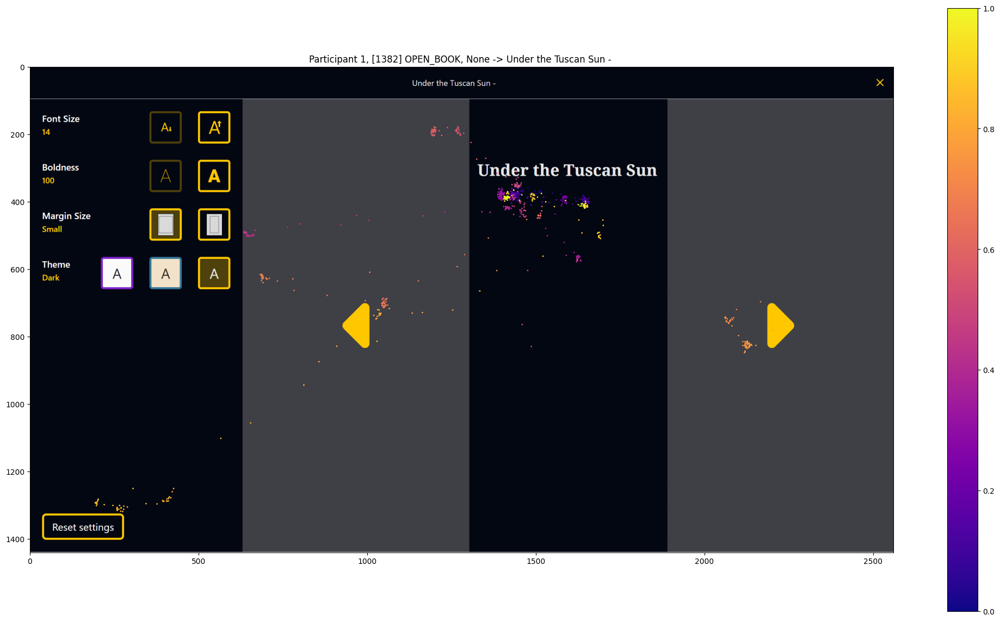

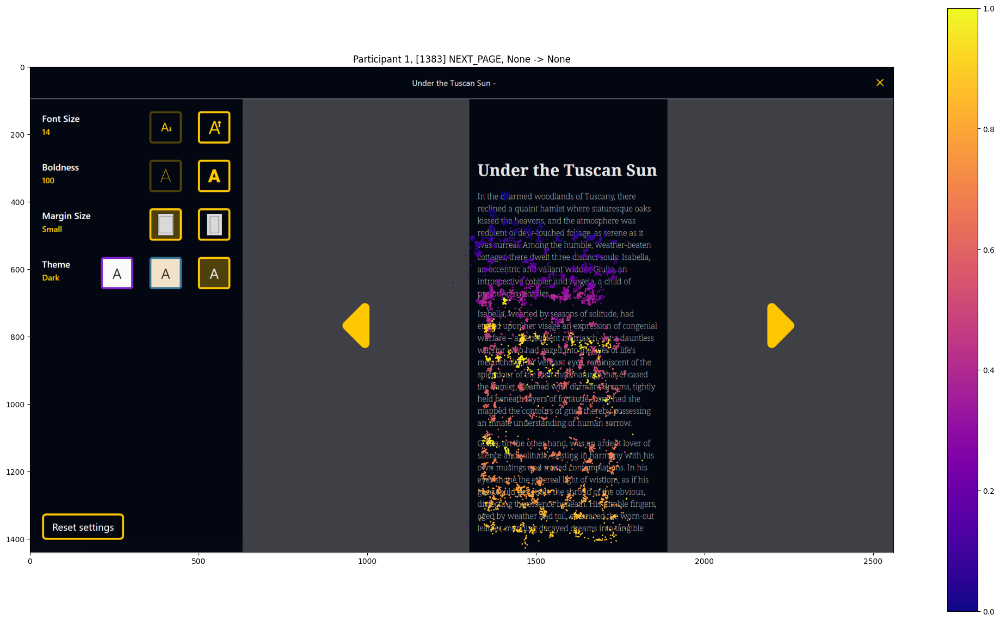

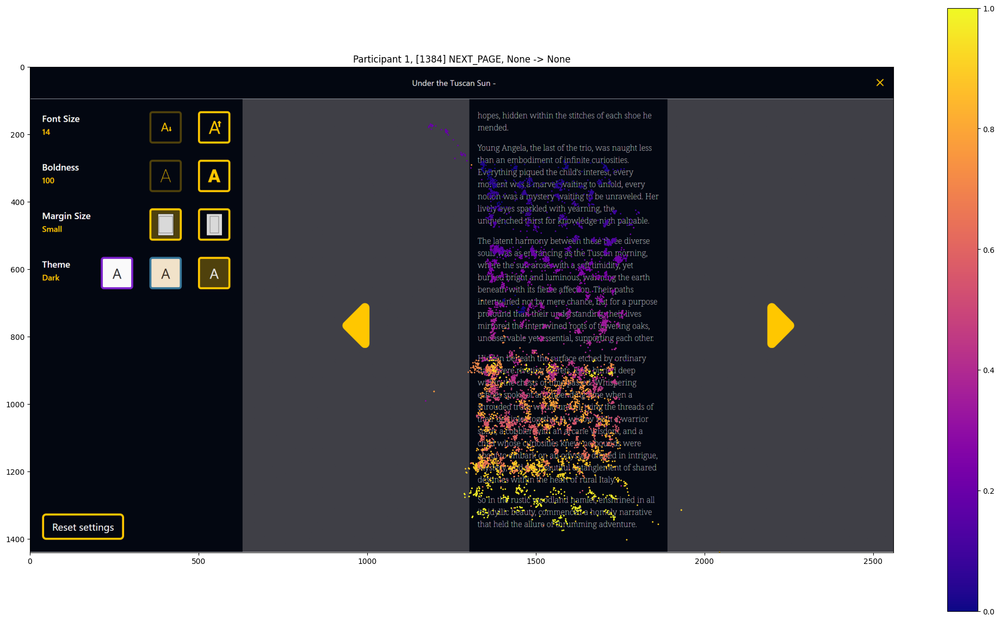

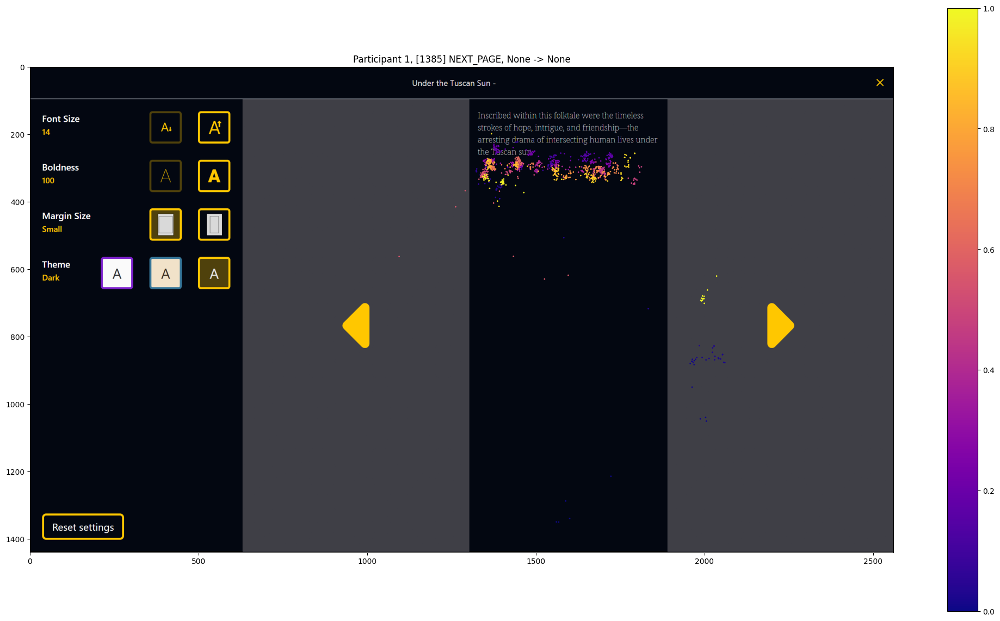

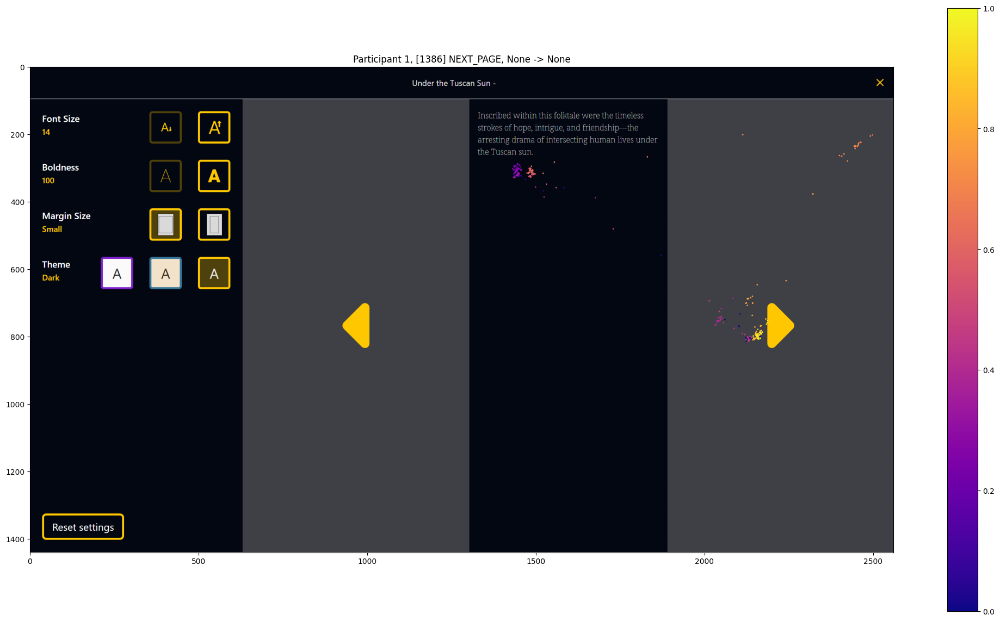

...

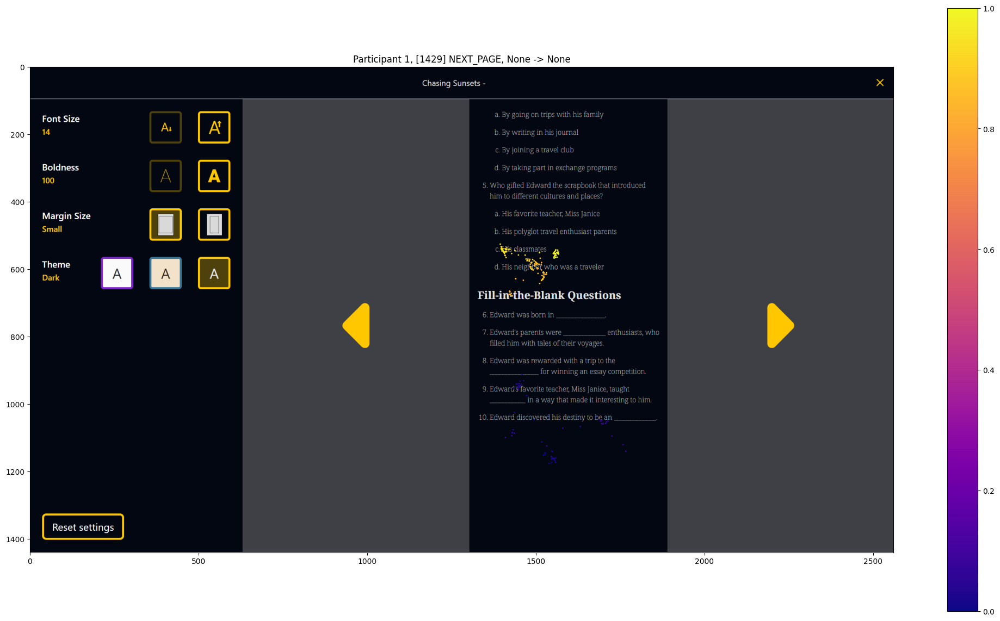

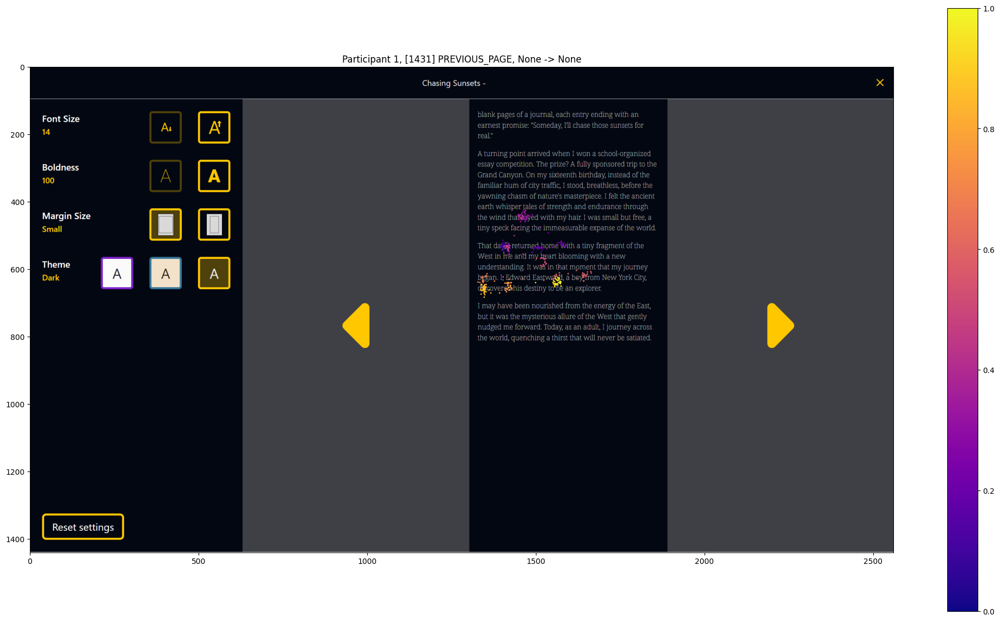

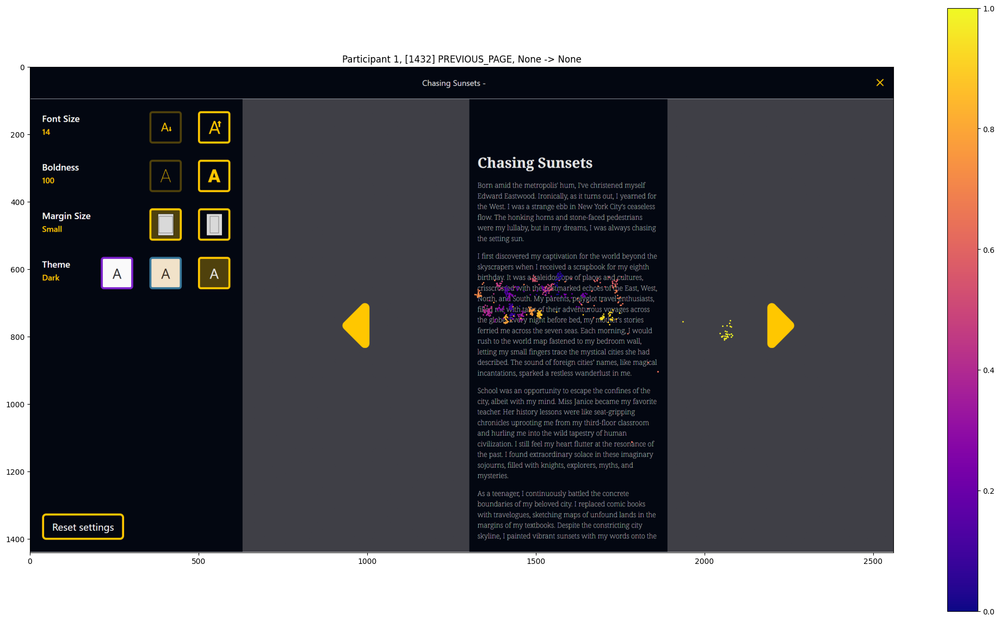

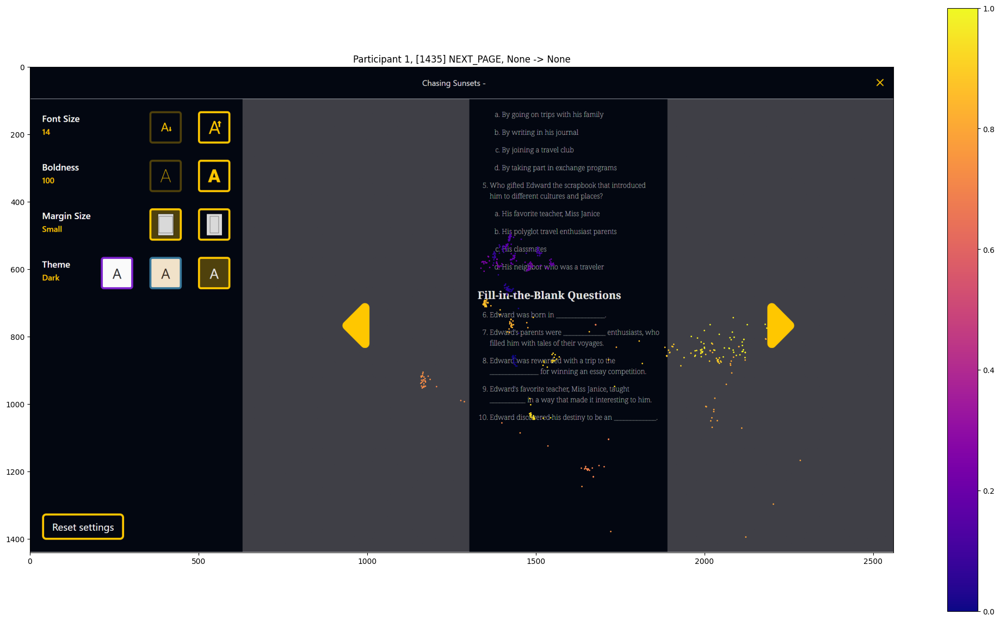

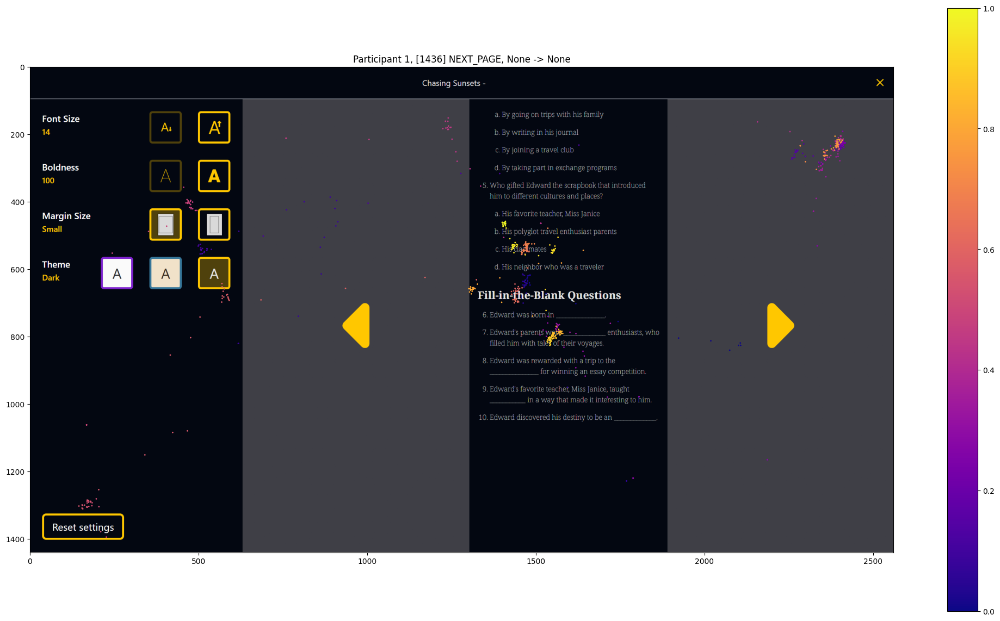

In [4]:
import os
from datetime import datetime

from utils import Events, extract_gaze_data_between_timestamps_proper, print_record

# participants that were told that they can change the settings beforehand
participant_ids = [1]

# get the events
for participant in participant_ids:
  events = Events.select().where(Events.participant_id==participant)

  current_json_file = None
  batches_of_events = {}
  current_batch = []
  for event in events:
    if event.event == "SELECT_TREATMENT":
      continue
    elif event.event == "CLOSE_BOOK":
      current_batch.append(event)
      batches_of_events[current_json_file] = current_batch
      current_batch = []
    elif event.event == "OPEN_BOOK":
      timestamp = event.time
      date = datetime.fromtimestamp(timestamp / 1000)
      date_string = date.strftime("%Y-%m-%d_%H-%M-%S")
      current_json_file = f"[{participant}]-{date_string}.json"
      current_batch.append(event)
    else:
      current_batch.append(event)

  # for each json file, get the gaze data
  for json_file, events in batches_of_events.items():
    # get the gaze data for this participant
    # the files are in eye_tracker_data/
    path = "eye_tracker_data/"

    # for start_event in events:
    gaze_data_filename = json_file
    gaze_data_filepath = os.path.join(path, gaze_data_filename)
    # Read the file
    import json
    with open(gaze_data_filepath, "r") as f:
      gaze_data = json.load(f)

    pairs = list(zip(events, events[1:]))
    for begin_page_event, end_page_event in pairs:
      T_start = begin_page_event.time
      T_end = end_page_event.time

      # ignore the event if the participant only looked at this page for less than 5 seconds
      if T_end - T_start < 1_000:
        continue

      gaze_data_between_pageturn_events = extract_gaze_data_between_timestamps_proper(gaze_data, T_start, T_end)['data']

      screenshot_path = begin_page_event.screenshot_file
      print_record(begin_page_event)
      plot_gaze_data_on_screenshot(gaze_data_between_pageturn_events, screenshot_path, title=f"Participant {participant}, [{begin_page_event.id}] {begin_page_event.event}, {begin_page_event.old_value} -> {begin_page_event.new_value}")


In [9]:
from utils import show_participant_screenshots


events = Events.select().where(Events.participant_id==999)
# show_participant_screenshots(events)